# Convert pdf to images

In [4]:
!pwd
import os
from pdf2image import convert_from_path

# Define source and destination directories
source_dir = 'test_sources'
dest_dir = 'pdf_images'

# Create destination directory if it doesn't exist
if not os.path.exists(dest_dir):
    os.makedirs(dest_dir)

# Define the maximum width and height for the output images
max_size = 1024

# Iterate through all PDF files in the source directory
for pdf_file in os.listdir(source_dir):
    print('Processing:', pdf_file)
    if pdf_file.endswith('.pdf'):
        pdf_path = os.path.join(source_dir, pdf_file)
        pdf_name = os.path.splitext(pdf_file)[0]
        
        # Create a folder with the PDF name in the destination directory
        pdf_folder = os.path.join(dest_dir, pdf_name)
        if not os.path.exists(pdf_folder):
            os.makedirs(pdf_folder)
        
        # Convert PDF to images
        images = convert_from_path(pdf_path, first_page=1,  last_page=3, dpi=200, size=max_size)
        
        # Save images in the corresponding folder
        for i, image in enumerate(images[:3]):
            image_path = os.path.join(pdf_folder, f'page_{i + 1}.png')
            print('Saving:', f'{image_path}')
            image.save(image_path, 'PNG')


/Users/elsie/Documents/Projects/RenAIssance-Test
Processing: PORCONES.228.35 – 1636.pdf
Saving: pdf_images/PORCONES.228.35 – 1636/page_1.png
Saving: pdf_images/PORCONES.228.35 – 1636/page_2.png
Saving: pdf_images/PORCONES.228.35 – 1636/page_3.png
Processing: Ezcaray - Vozes.pdf
Saving: pdf_images/Ezcaray - Vozes/page_1.png
Saving: pdf_images/Ezcaray - Vozes/page_2.png
Saving: pdf_images/Ezcaray - Vozes/page_3.png
Processing: Constituciones sinodales Calahorra 1602.pdf
Saving: pdf_images/Constituciones sinodales Calahorra 1602/page_1.png
Saving: pdf_images/Constituciones sinodales Calahorra 1602/page_2.png
Saving: pdf_images/Constituciones sinodales Calahorra 1602/page_3.png
Processing: Paredes - Reglas generales.pdf
Saving: pdf_images/Paredes - Reglas generales/page_1.png
Saving: pdf_images/Paredes - Reglas generales/page_2.png
Saving: pdf_images/Paredes - Reglas generales/page_3.png
Processing: Mendo - Principe perfecto.pdf
Saving: pdf_images/Mendo - Principe perfecto/page_1.png
Savin

# Extract Text Using Gemini

In [ ]:
GEMINI_API_KEY = "" # TODO: Add your Gemini API key here

In [10]:
prompt = """
Here is a piece of Spanish printed document from the seventeenth century.
============
NOTE THAT:		
		two types of lowercase “s” -> ‘s’ and ‘ſ’  both should be transcribed as ‘s’
		some letters have macrons (¯)		
		some line end hyphens not present,	leave words split for now, can decide later
		ç old spelling is always modern z	

============
Recognizing the text in this document. You should be able to detect the main text on each page while disregarding other embellishments.
JUST IN CASE YOU NEED IT: The language is Spanish.
ONLY GENERATE TEXT WITHOUT ANY TRANSLATION.
"""

In [ ]:
import os
from google import genai
from google.genai import types
from PIL import Image

# Define source directory for images
source_dir = 'pdf_images'
result_dir = 'gemini_result'

# Initialize the Gemini client with the API key
client = genai.Client(api_key=GEMINI_API_KEY)

# Iterate through all folders in the source directory
for folder in os.listdir(source_dir):
    folder_path = os.path.join(source_dir, folder)
    if os.path.isdir(folder_path):
        # Create a folder with the same name in the result directory
        result_folder = os.path.join(result_dir, folder)
        if not os.path.exists(result_folder):
            os.makedirs(result_folder)
        # Iterate through all images in the folder
        for image_file in os.listdir(folder_path):
            if image_file.endswith('.png'):
                image_path = os.path.join(folder_path, image_file)
                image = Image.open(image_path)
                
                # Interact with the Gemini LLM for the image
                response = client.models.generate_content(
                    model="gemini-2.0-flash",
                    contents=[prompt, image]
                )
                
                # Write the response to a separate text file for each page
                output_file = os.path.join(result_dir, folder,  f'{image_file.replace(".png","")}.txt')
                with open(output_file, 'w') as f:
                    f.write(response.text)
                    print('Saved:', output_file)
            
    

# Extract Text Using Tesseract

In [12]:
import cv2
import numpy as np
from scipy.ndimage import gaussian_filter1d, label
# import pytesseract

In [16]:
import matplotlib.pyplot as plt

def display_regions(image, regions, cols=3):
    """
    Display multiple regions of an image in a grid.

    :param image: The original image.
    :param regions: List of regions to display.
    :param cols: Number of columns in the grid.
    """
    n_regions = len(regions)
    rows = (n_regions + cols - 1) // cols  # Calculate the number of rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()  # Flatten the axes array for easy iteration

    for i, (region, ax) in enumerate(zip(regions, axes)):
        filtered_image = image[:, region[0]:region[1]]
        ax.imshow(filtered_image)
        ax.axis('off')  # Hide the axis

    # Hide any remaining empty subplots
    for ax in axes[n_regions:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [17]:
def extract_main_reigions(image_path):
        # Read the document image
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Otsu thresholding to get a binary image
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Compute the vertical projection profile
    vertical_proj = np.mean(thresh, axis=0)

    # Smooth the projection profile
    smoothed_data = gaussian_filter1d(vertical_proj, sigma=10)

    # Identify regions below the threshold
    threshold = smoothed_data.mean() + (smoothed_data.max() - smoothed_data.mean()) * 0.1
    below_threshold = smoothed_data < threshold
    labeled_array, num_features = label(below_threshold)

    # Extract start and end indices of these regions
    buffer = 20
    regions = []
    for i in range(1, num_features + 1):
        indices = np.where(labeled_array == i)[0]
        start = max(indices[0] - buffer, 0)
        end = min(indices[-1] + buffer, image.shape[1])
        if end - start > 100:  # Ensure the width of the region is wider than 100 pixels
            regions.append((start, end))

    # Merge adjacent regions if the distance between them is less than 50 pixels
    merged_regions = []
    current_region = regions[0]
    for next_region in regions[1:]:
        if next_region[0] - current_region[1] < 10:
            current_region = (current_region[0], next_region[1])
        else:
            merged_regions.append(current_region)
            current_region = next_region
    merged_regions.append(current_region)
    
    # Display the identified regions
    display_regions(image, merged_regions)
    
    filtered_images = []
    for region in merged_regions:
        filtered_images.append( image[:, region[0]:region[1]])
        
    return filtered_images

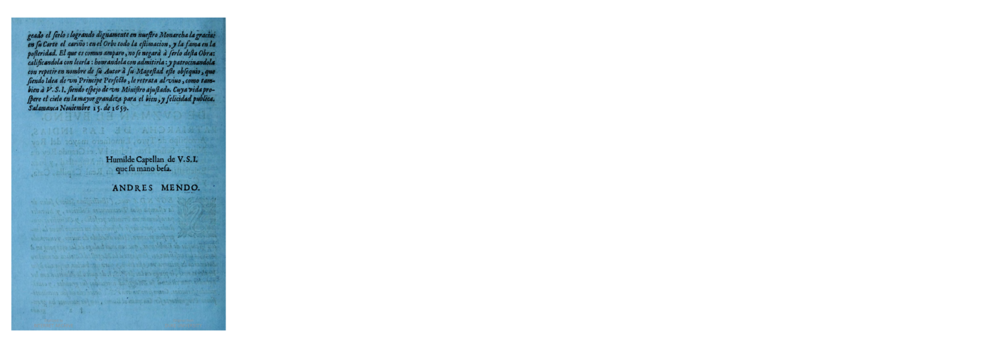

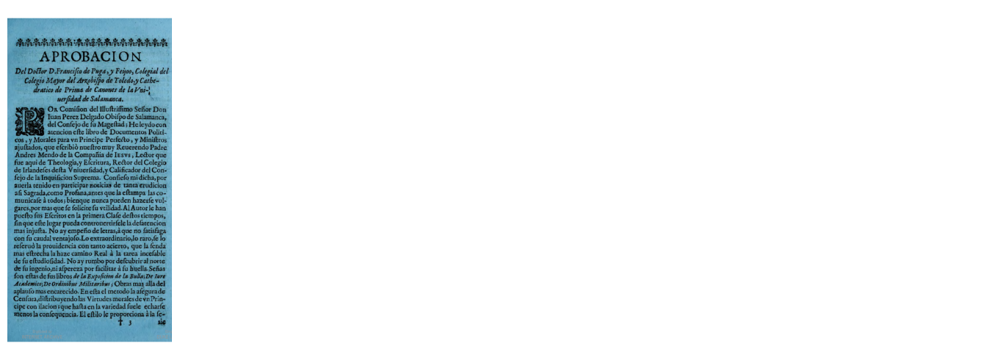

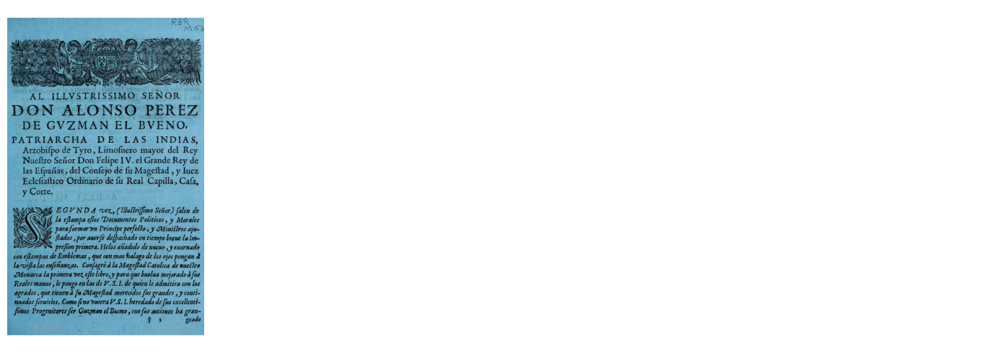

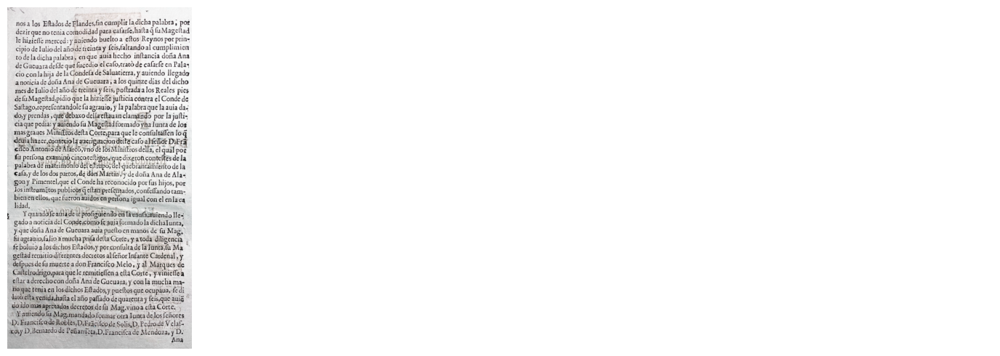

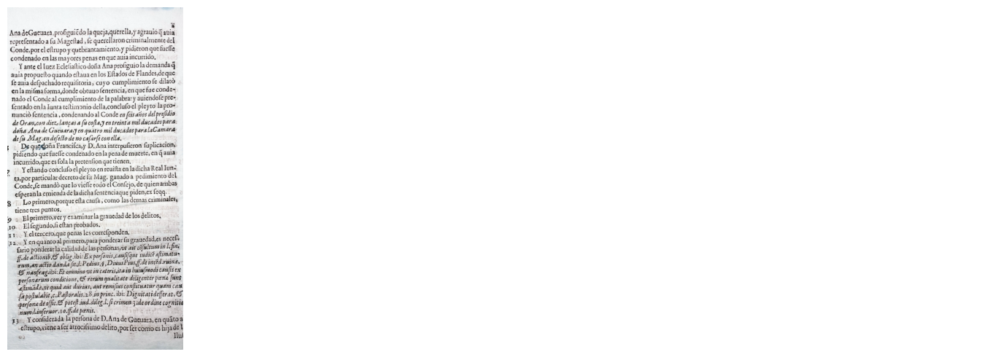

...

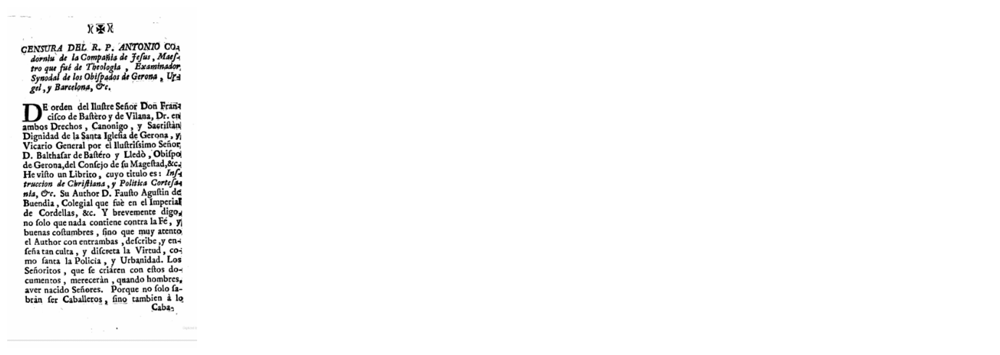

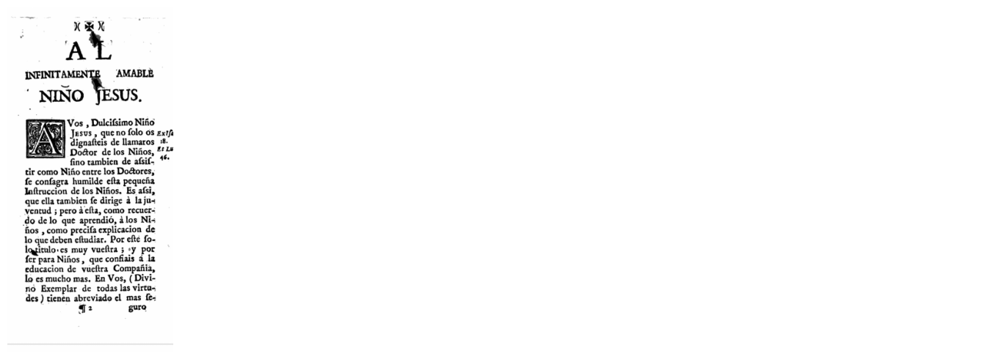

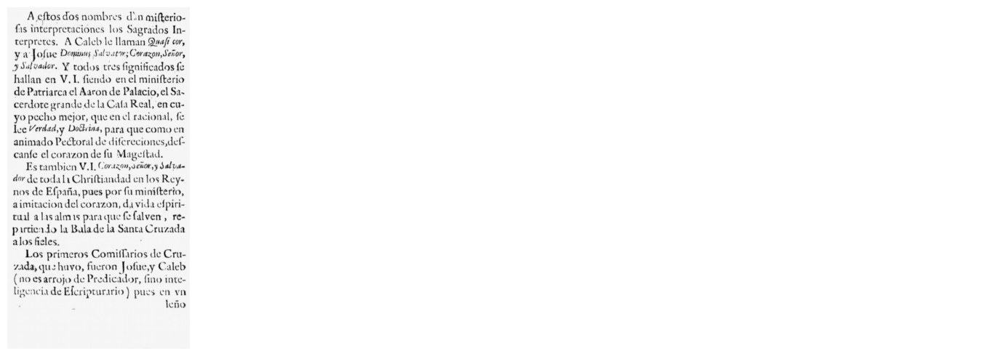

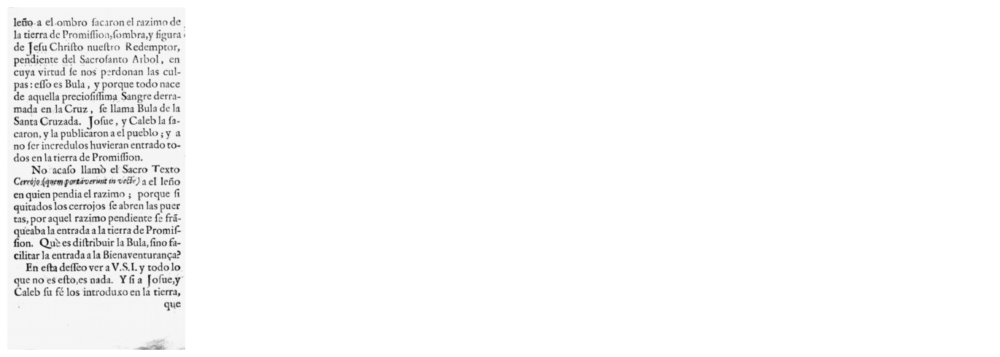

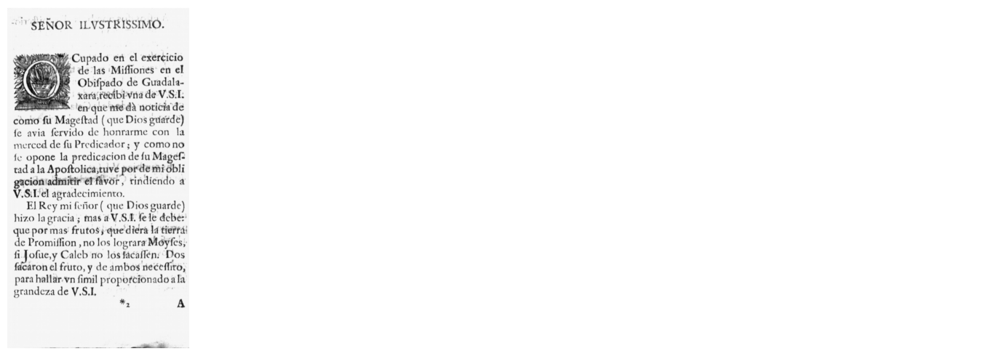

In [24]:
from PIL import Image
import cv2
import numpy as np
source_dir = 'pdf_images'
result_dir = 'extracted_imgs'
for folder in os.listdir(source_dir):
    folder_path = os.path.join(source_dir, folder)
    os.makedirs(f"{result_dir}/{folder}", exist_ok=True)
    for image_file in os.listdir(folder_path):
        if image_file.endswith('.png'):
            image_path = os.path.join(folder_path, image_file)
            image = Image.open(image_path)
            filtered_images = extract_main_reigions(image_path)
            for i, filtered_image in enumerate(filtered_images):
                output_file = os.path.join(result_dir, folder,  f'{image_file}')
                plt.imsave(output_file, filtered_image)

In [ ]:

def extract_text_from_image(image_path, lang='spa'):
    # Read the document image
    filtered_images = extract_main_reigions(image_path)
    # Extract text from each identified region using OCR
    extracted_text = ""
    for filtered_image in filtered_images:
        text = pytesseract.image_to_string(filtered_image, config='--psm 6', lang=lang)
        extracted_text += f"{text}\n"

    return extracted_text

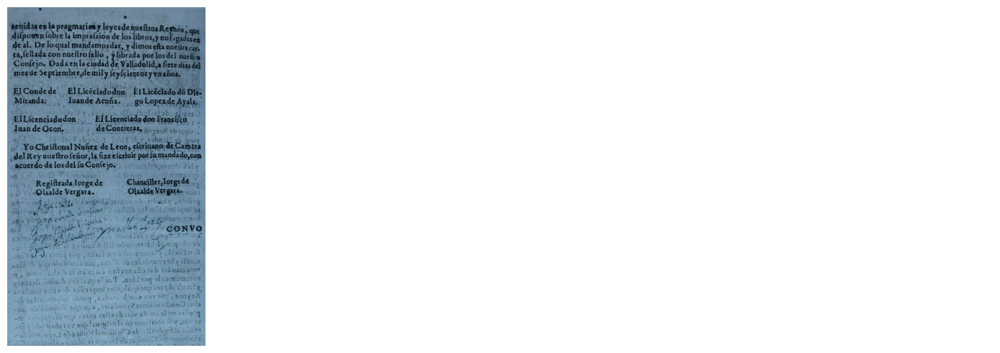

Saved: tesseract_result/Constituciones/page_2.txt


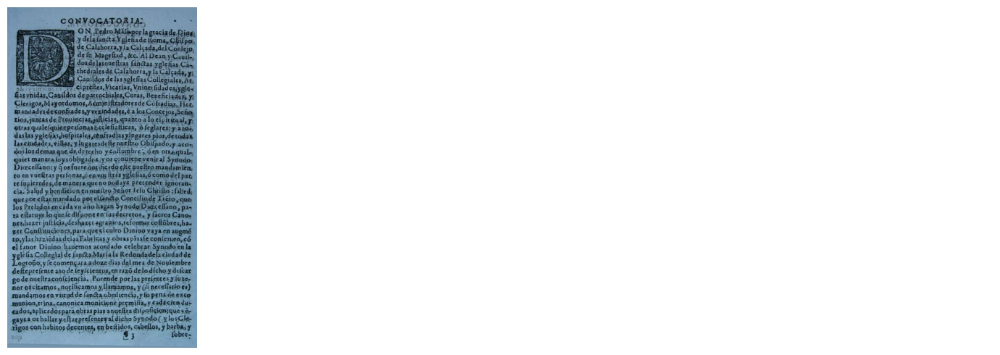

Saved: tesseract_result/Constituciones/page_3.txt


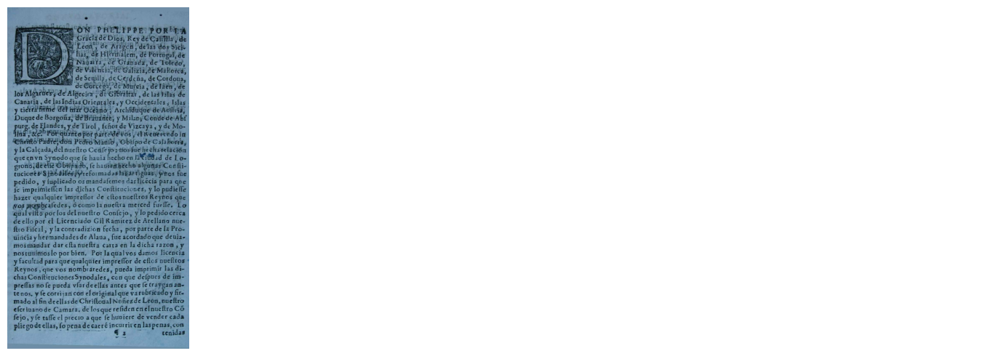

Saved: tesseract_result/Constituciones/page_1.txt


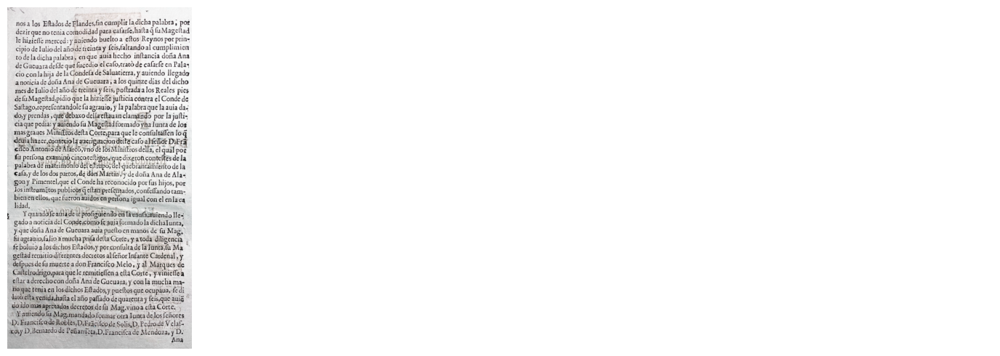

Saved: tesseract_result/PORCONES/page_2.txt


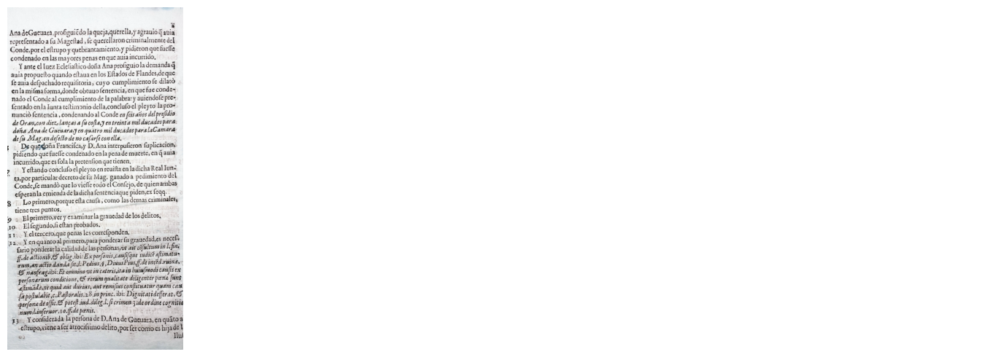

Saved: tesseract_result/PORCONES/page_3.txt


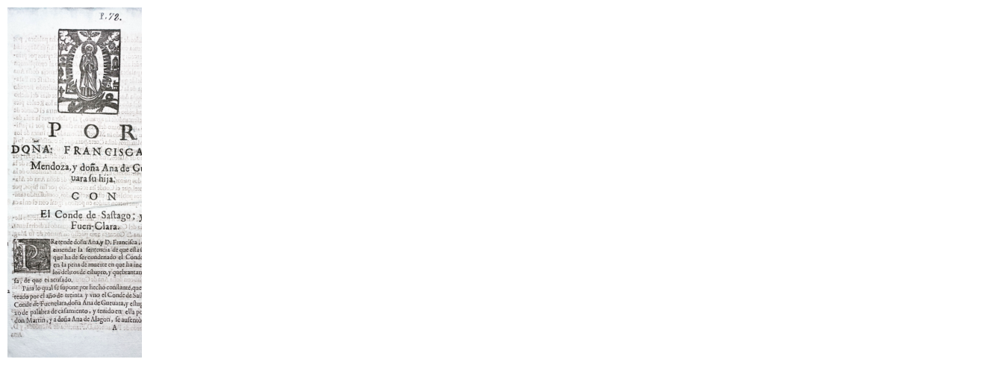

Saved: tesseract_result/PORCONES/page_1.txt


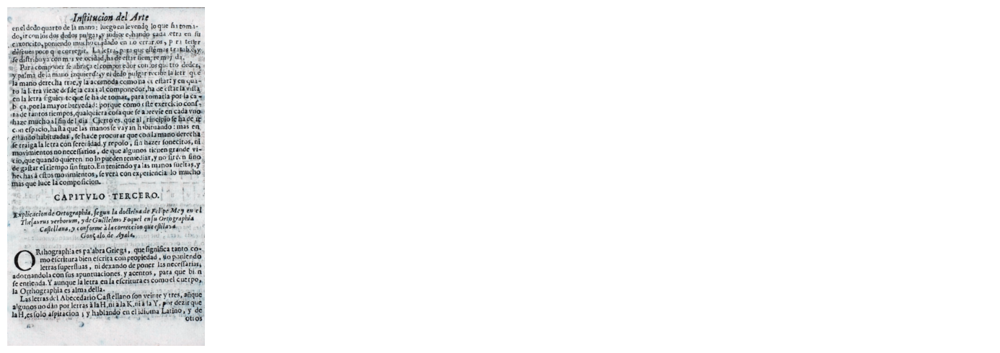

Saved: tesseract_result/Paredes/page_2.txt


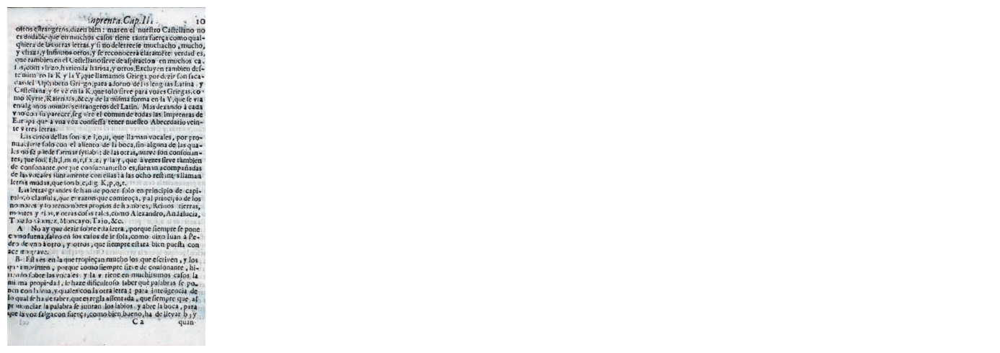

Saved: tesseract_result/Paredes/page_3.txt


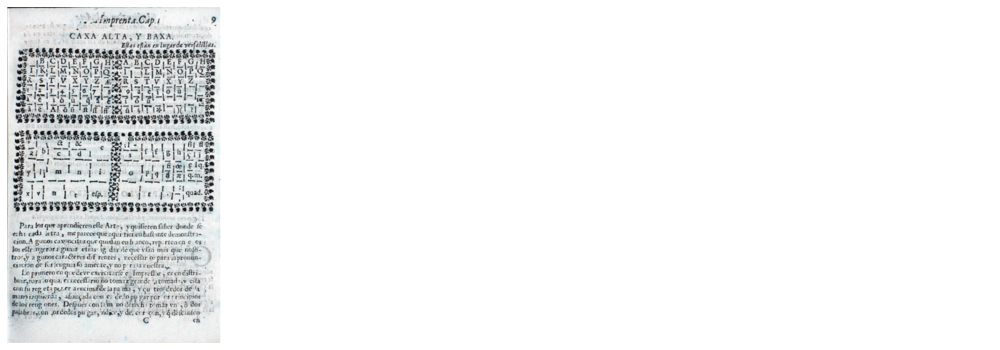

Saved: tesseract_result/Paredes/page_1.txt


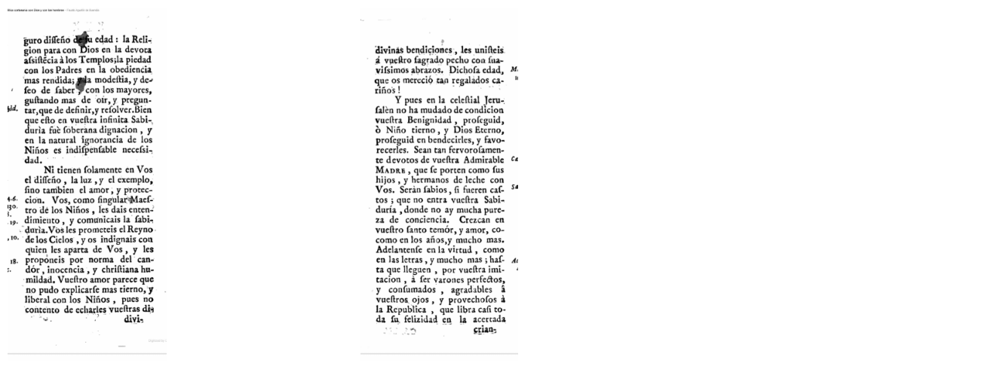

Saved: tesseract_result/Buendia/page_2.txt


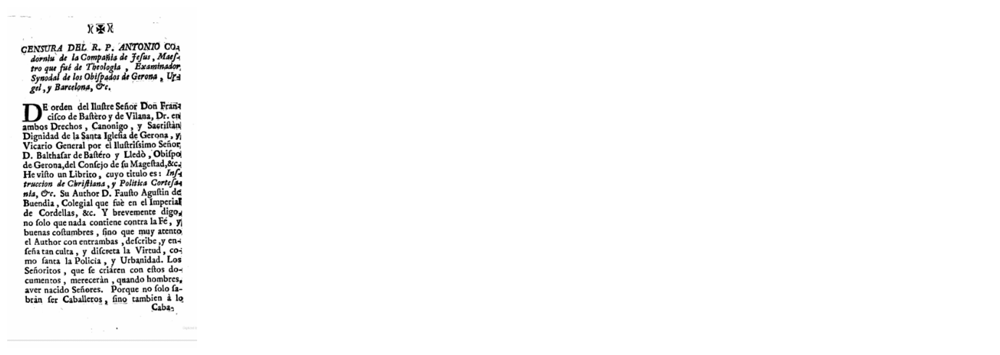

Saved: tesseract_result/Buendia/page_3.txt


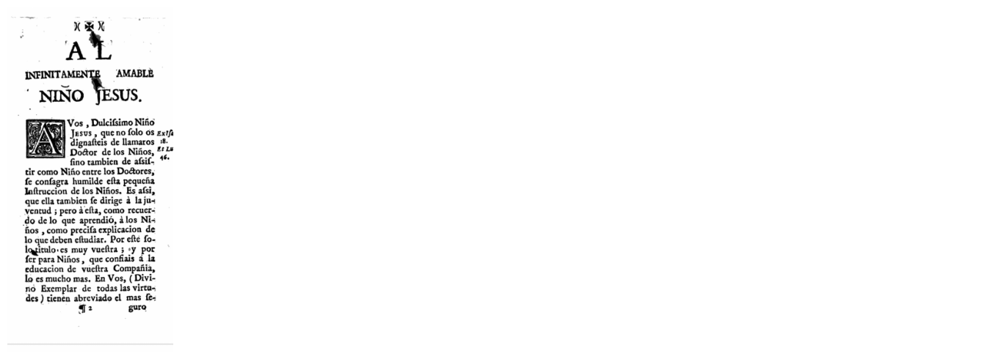

Saved: tesseract_result/Buendia/page_1.txt


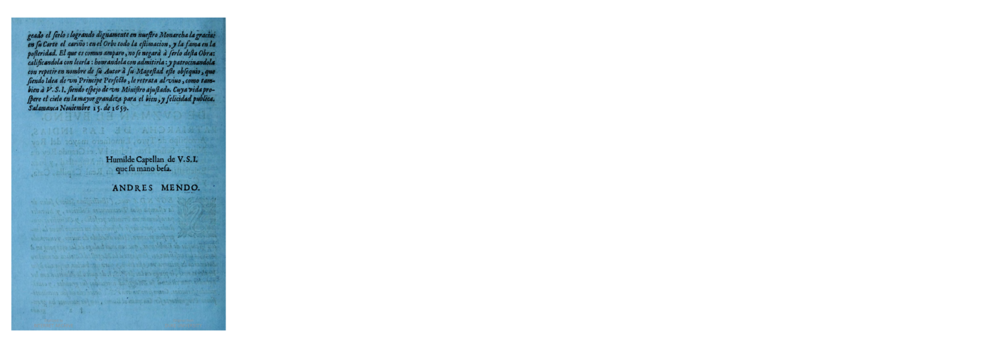

Saved: tesseract_result/Mendo/page_2.txt


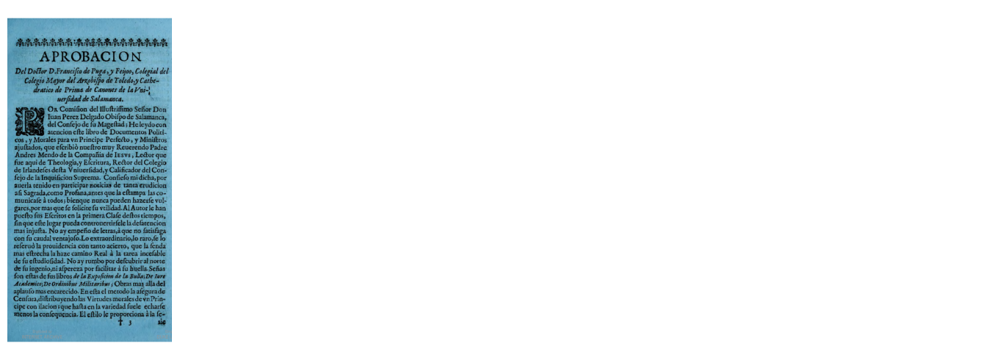

Saved: tesseract_result/Mendo/page_3.txt


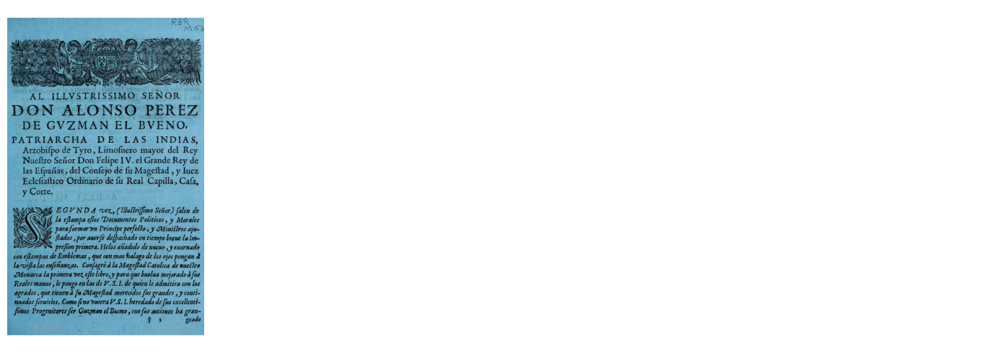

Saved: tesseract_result/Mendo/page_1.txt


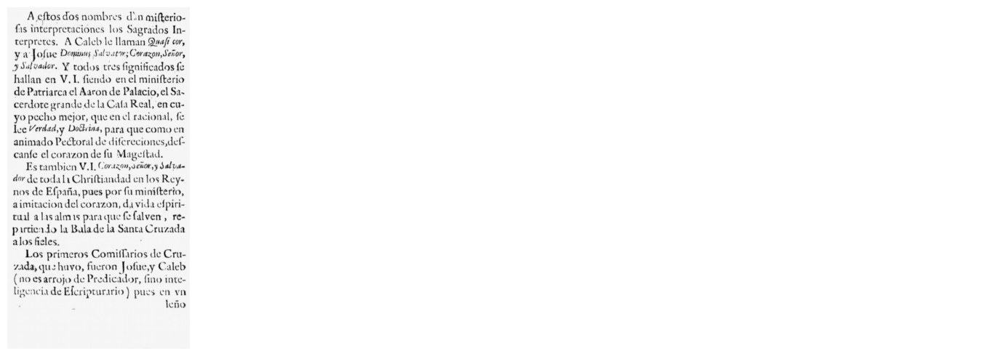

Saved: tesseract_result/Ezcaray/page_2.txt


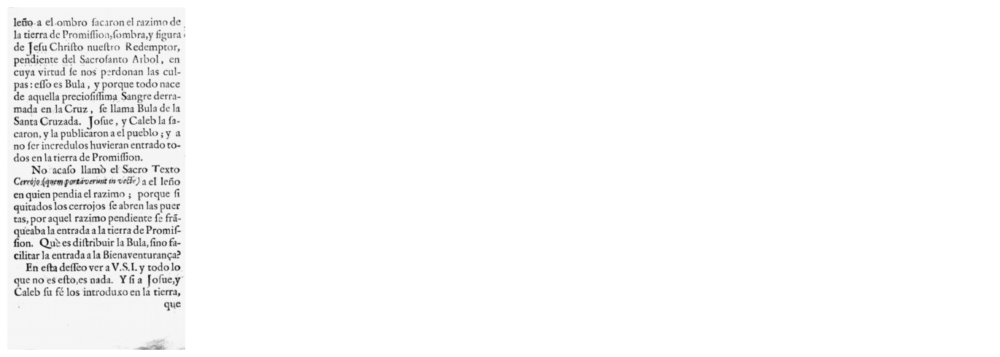

Saved: tesseract_result/Ezcaray/page_3.txt


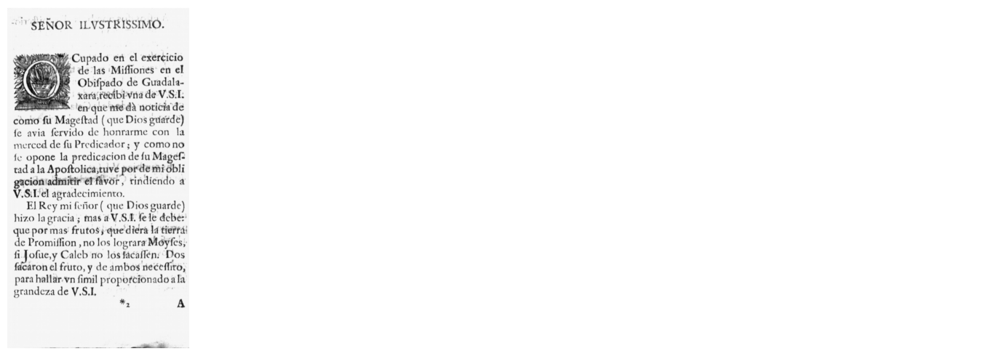

Saved: tesseract_result/Ezcaray/page_1.txt


In [75]:
import os
from google import genai
from google.genai import types
from PIL import Image

# Define source directory for images
source_dir = 'pdf_images'
result_dir = 'tesseract_result'

# Iterate through all folders in the source directory
for folder in os.listdir(source_dir):
    folder_path = os.path.join(source_dir, folder)
    if os.path.isdir(folder_path):
        # Create a folder with the same name in the result directory
        result_folder = os.path.join(result_dir, folder)
        if not os.path.exists(result_folder):
            os.makedirs(result_folder)
        # Iterate through all images in the folder
        for image_file in os.listdir(folder_path):
            if image_file.endswith('.png'):
                image_path = os.path.join(folder_path, image_file)
                image = Image.open(image_path)
                
                # Interact with the Gemini LLM for the image
                response = extract_text_from_image(image_path)
                
                # Write the response to a separate text file for each page
                output_file = os.path.join(result_dir, folder,  f'{image_file.replace(".png","")}.txt')
                with open(output_file, 'w') as f:
                    f.write(response)
                    print('Saved:', output_file)

# Extract Text Using easyocr

In [87]:
import easyocr
reader = easyocr.Reader(['es'], gpu=False)

Using CPU. Note: This module is much faster with a GPU.


In [88]:
import cv2
import numpy as np
from scipy.ndimage import gaussian_filter1d, label
import pytesseract

def extract_text_from_image(image_path, lang='spa'):
    # Read the document image
    filtered_images = extract_main_reigions(image_path)
    # Extract text from each identified region using OCR
    extracted_text = ""
    for filtered_image in filtered_images:
        text = reader.readtext(filtered_image, detail=0, paragraph=True)
        text = "\n".join(text)
        extracted_text += f"{text}\n"

    return extracted_text

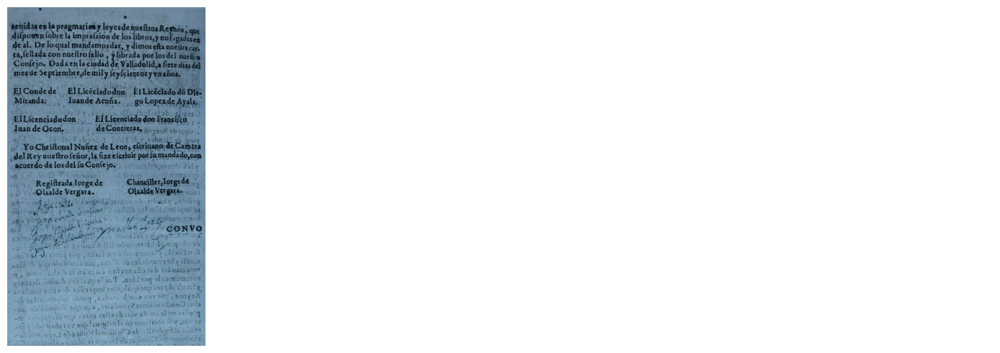

Saved: easyocr_result/Constituciones/page_2.txt


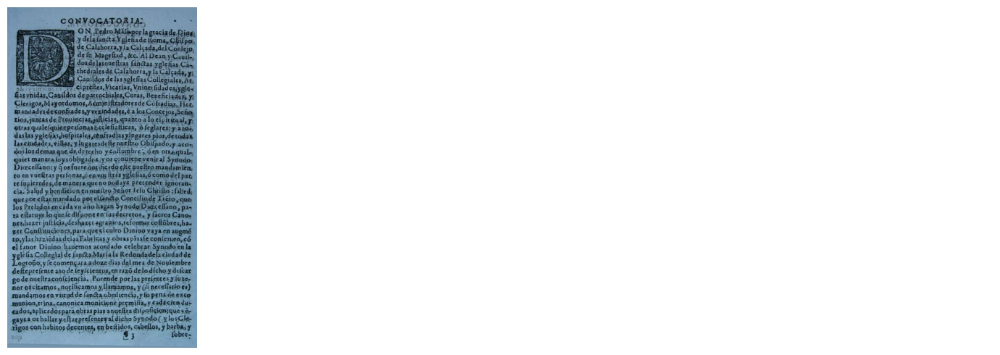

Saved: easyocr_result/Constituciones/page_3.txt


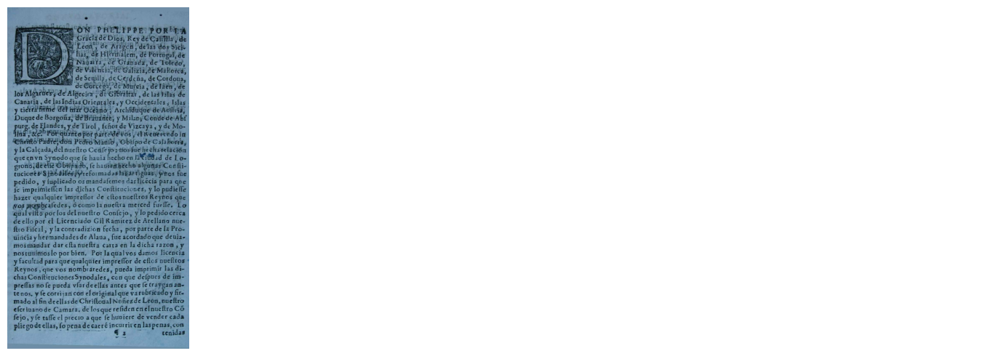

Saved: easyocr_result/Constituciones/page_1.txt


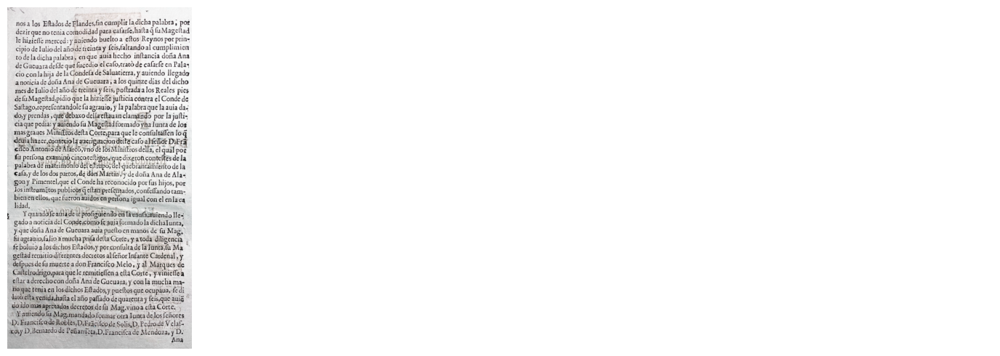

Saved: easyocr_result/PORCONES/page_2.txt


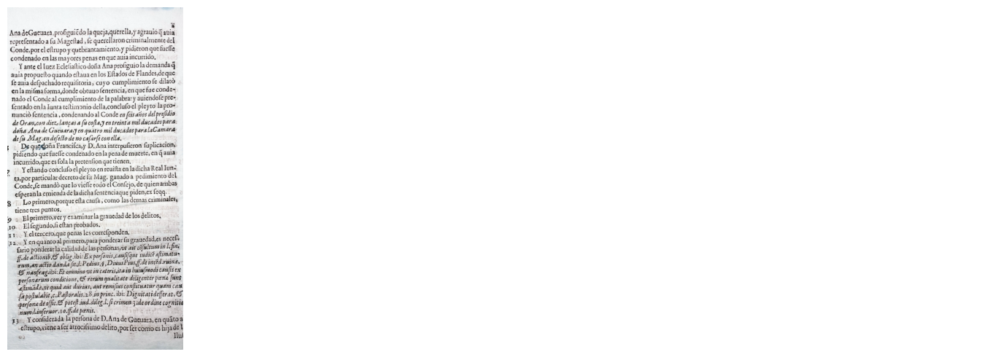

Saved: easyocr_result/PORCONES/page_3.txt


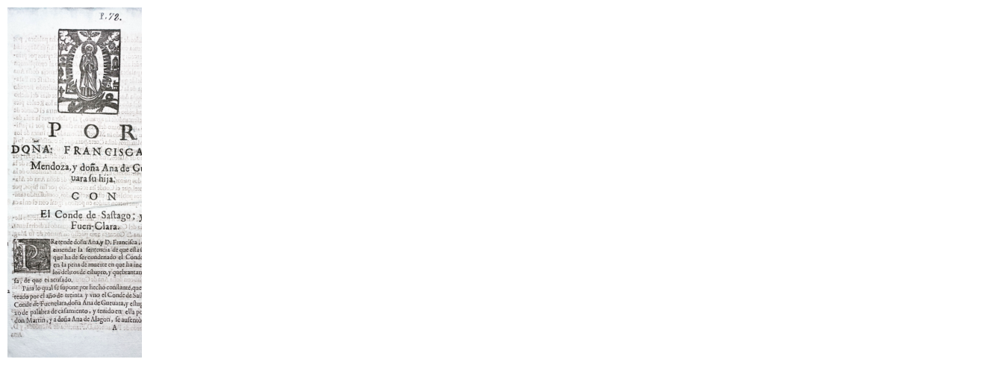

Saved: easyocr_result/PORCONES/page_1.txt


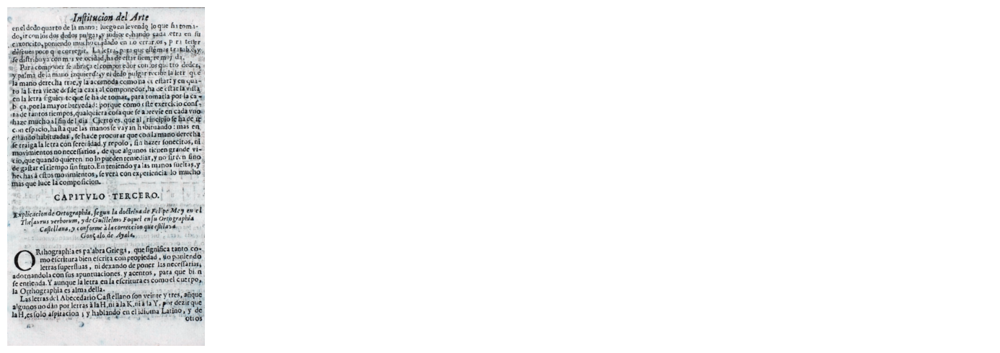

Saved: easyocr_result/Paredes/page_2.txt


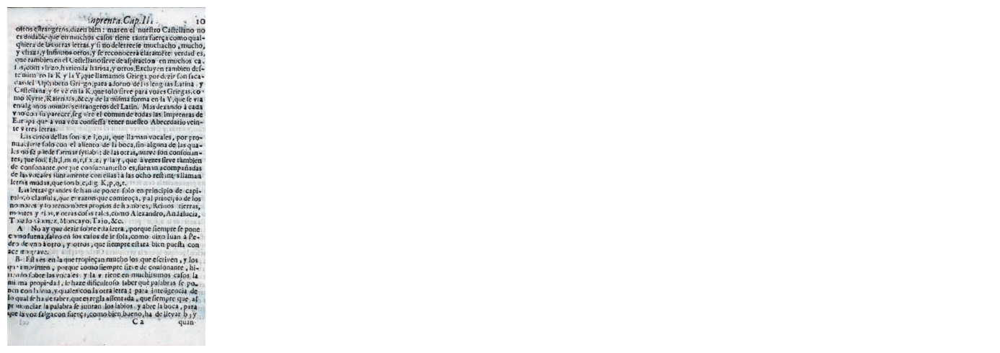

Saved: easyocr_result/Paredes/page_3.txt


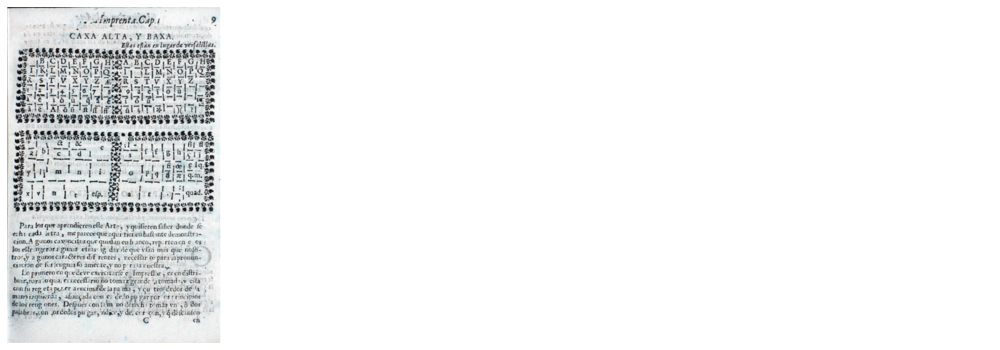

Saved: easyocr_result/Paredes/page_1.txt


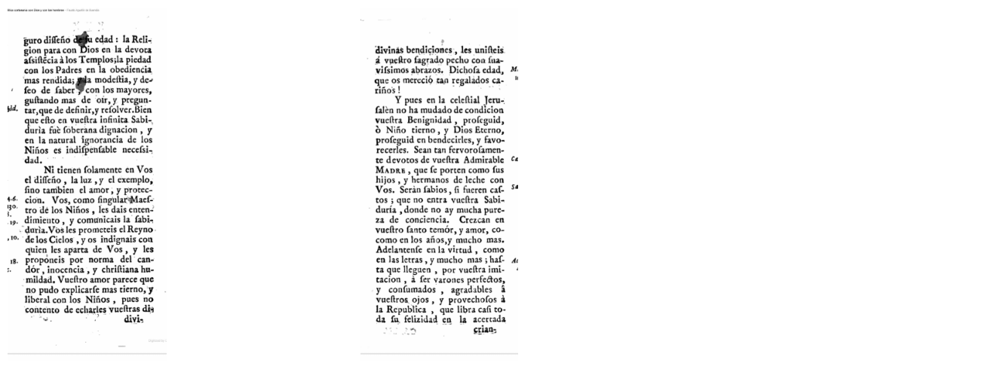

Saved: easyocr_result/Buendia/page_2.txt


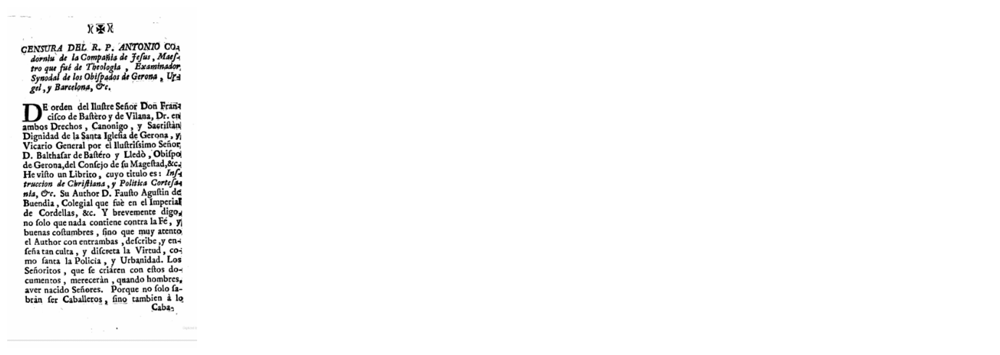

Saved: easyocr_result/Buendia/page_3.txt


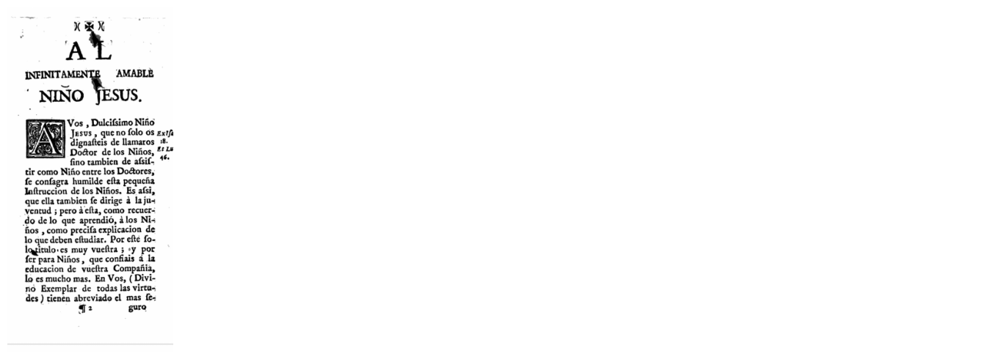

Saved: easyocr_result/Buendia/page_1.txt


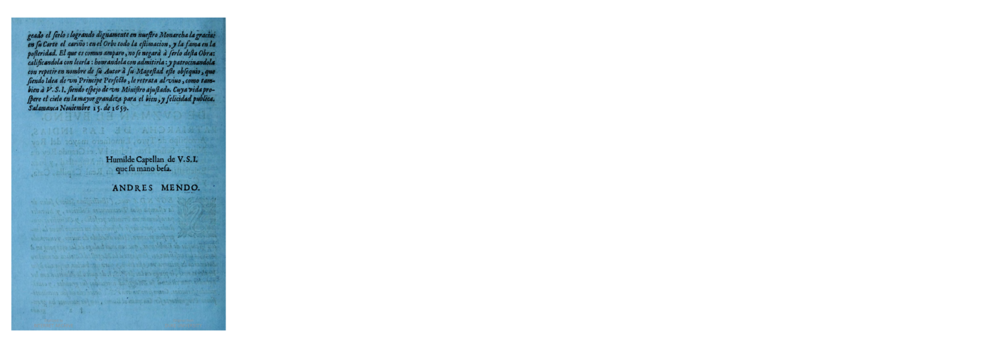

Saved: easyocr_result/Mendo/page_2.txt


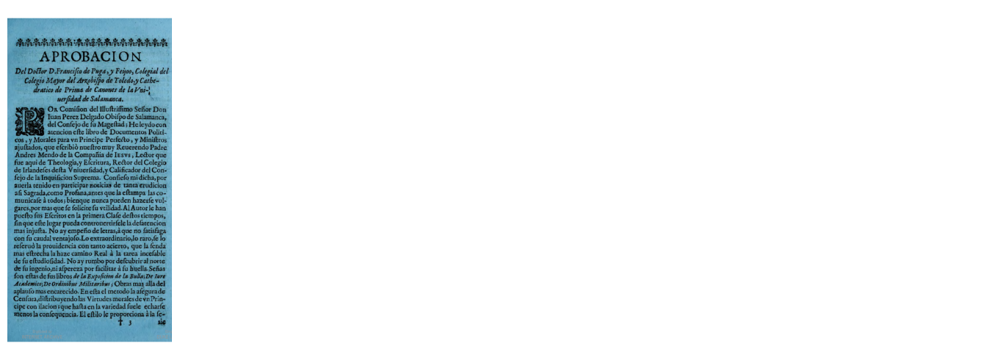

Saved: easyocr_result/Mendo/page_3.txt


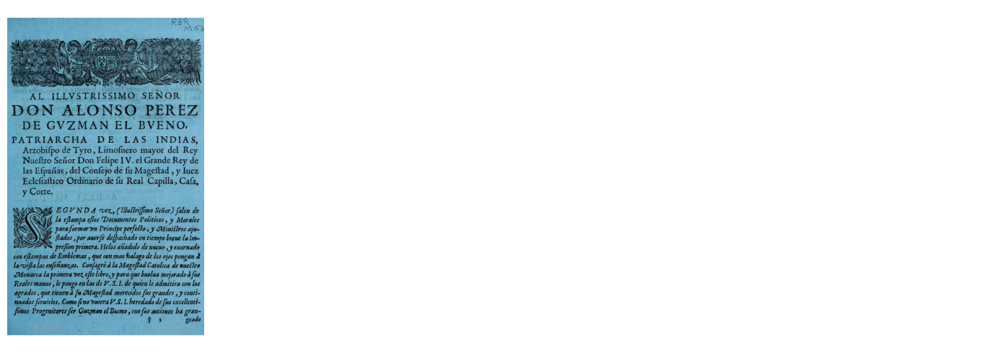

Saved: easyocr_result/Mendo/page_1.txt


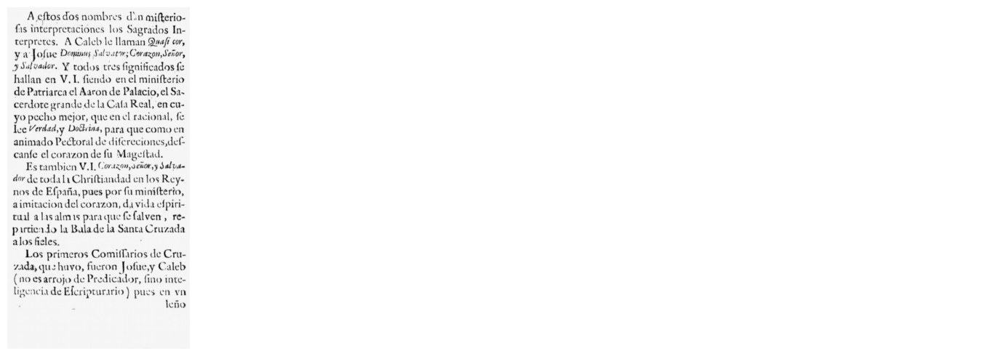

Saved: easyocr_result/Ezcaray/page_2.txt


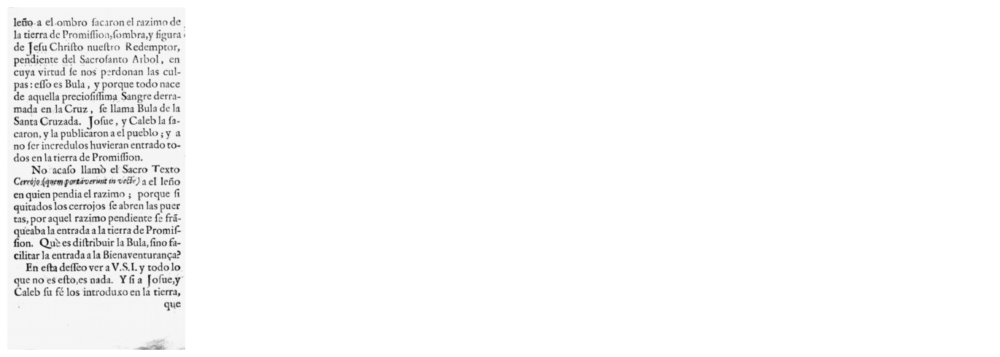

Saved: easyocr_result/Ezcaray/page_3.txt


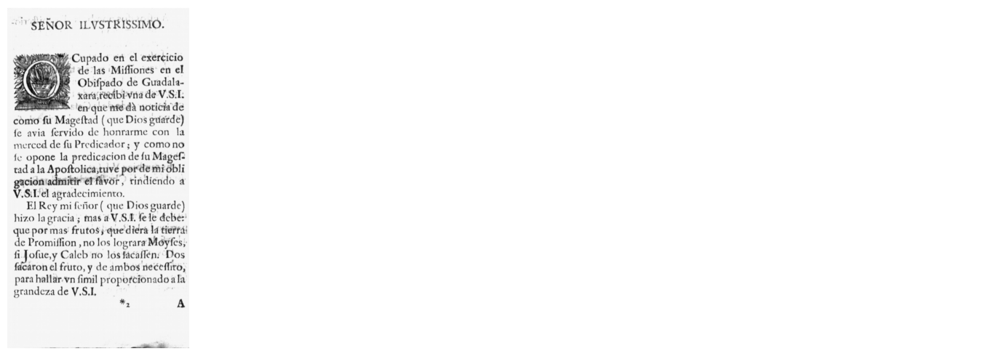

Saved: easyocr_result/Ezcaray/page_1.txt


In [89]:
import os
from google import genai
from google.genai import types
from PIL import Image

# Define source directory for images
source_dir = 'pdf_images'
result_dir = 'easyocr_result'

# Iterate through all folders in the source directory
for folder in os.listdir(source_dir):
    folder_path = os.path.join(source_dir, folder)
    if os.path.isdir(folder_path):
        # Create a folder with the same name in the result directory
        result_folder = os.path.join(result_dir, folder)
        if not os.path.exists(result_folder):
            os.makedirs(result_folder)
        # Iterate through all images in the folder
        for image_file in os.listdir(folder_path):
            if image_file.endswith('.png'):
                image_path = os.path.join(folder_path, image_file)
                image = Image.open(image_path)
                
                # Interact with the Gemini LLM for the image
                response = extract_text_from_image(image_path)
                
                # Write the response to a separate text file for each page
                output_file = os.path.join(result_dir, folder,  f'{image_file.replace(".png","")}.txt')
                with open(output_file, 'w') as f:
                    f.write(response)
                    print('Saved:', output_file)

# Evaluation

In [99]:
import os
import jiwer
import pandas as pd
import unicodedata

# Function to remove diacritical marks except for ñ (and Ñ)
def remove_accents_except_n(text):
    result = ""
    for char in text:
        if char in "ñÑ":
            result += char
        else:
            decomposed = unicodedata.normalize('NFD', char)
            filtered = ''.join(c for c in decomposed if unicodedata.category(c) != 'Mn')
            result += filtered
    return result

def remove_duplicate_whitespace(text):
    return ' '.join(text.split())

def generate_result(output_dir, reference_dir = 'pdf_labels'):
    print(f'Evaluating {output_dir} against {reference_dir}')
    # Initialize lists to store WER and CER results
    results = []
    
    # Iterate through all folders in the reference directory
    for folder in os.listdir(reference_dir):
        folder_path = os.path.join(reference_dir, folder)
        if os.path.isdir(folder_path):
            # Iterate through all text files in the folder
            for ref_file in os.listdir(folder_path):
                if ref_file.endswith('.txt'):
                    ref_path = os.path.join(folder_path, ref_file)
                    out_path = os.path.join(output_dir, folder, ref_file)
    
                    # Read the reference text
                    with open(ref_path, 'r') as f:
                        ref_text = f.read()
    
                    # Read the output text
                    if os.path.exists(out_path):
                        with open(out_path, 'r') as f:
                            out_text = f.read()
    
                        # Apply the custom transformation
                        ref_text = remove_accents_except_n(ref_text)
                        out_text = remove_accents_except_n(out_text)
                        
                        # Remove duplicate whitespaces
                        ref_text = remove_duplicate_whitespace(ref_text)
                        out_text = remove_duplicate_whitespace(out_text)
    
                        # Calculate WER and CER using jiwer
                        wer = jiwer.wer(ref_text, out_text)
                        cer = jiwer.cer(ref_text, out_text)
    
                        # Print the results
                        print(f'{folder}/{ref_file} - WER: {wer:.4f}, CER: {cer:.4f}')
    
                        # Store the results in the list
                        results.append({'file': f'{folder}/{ref_file}', 'WER': wer, 'CER': cer})
    
    # Create a pandas DataFrame from the results
    df = pd.DataFrame(results)
    
    # Write the DataFrame to a CSV file
    df.to_csv(f'{output_dir}.csv', index=False)
    return df

In [100]:
df = generate_result('tesseract_result')
print("Average WER:", df['WER'].mean())
print("Average CER:", df['CER'].mean())

Evaluating tesseract_result against pdf_labels
Constituciones/page_3.txt - WER: 0.7466, CER: 0.2194
Constituciones/page_2.txt - WER: 0.8692, CER: 0.3626
Constituciones/page_1.txt - WER: 0.5824, CER: 0.2123
PORCONES/page_3.txt - WER: 0.6711, CER: 0.1769
PORCONES/page_2.txt - WER: 0.4966, CER: 0.1338
PORCONES/page_1.txt - WER: 0.7829, CER: 0.4167
Paredes/page_3.txt - WER: 0.7226, CER: 0.2008
Paredes/page_2.txt - WER: 0.6334, CER: 0.2001
Paredes/page_1.txt - WER: 0.8262, CER: 0.3887
Buendia/page_3.txt - WER: 0.6543, CER: 0.2627
Buendia/page_2.txt - WER: 0.4805, CER: 0.1163
Buendia/page_1.txt - WER: 0.5752, CER: 0.1837
Mendo/page_3.txt - WER: 0.4645, CER: 0.1007
Mendo/page_2.txt - WER: 0.4732, CER: 0.0925
Mendo/page_1.txt - WER: 0.5148, CER: 0.1400
Ezcaray/page_3.txt - WER: 0.3293, CER: 0.0803
Ezcaray/page_2.txt - WER: 0.4295, CER: 0.0921
Ezcaray/page_1.txt - WER: 0.5760, CER: 0.1825
Average WER: 0.6015817359399998
Average CER: 0.19790259199581597


In [102]:
df = generate_result('easyocr_result')
print("Average WER:", df['WER'].mean())
print("Average CER:", df['CER'].mean())

Evaluating easyocr_result against pdf_labels
Constituciones/page_3.txt - WER: 0.8485, CER: 0.2673
Constituciones/page_2.txt - WER: 1.7154, CER: 1.2033
Constituciones/page_1.txt - WER: 0.7074, CER: 0.1879
PORCONES/page_3.txt - WER: 0.8209, CER: 0.2310
PORCONES/page_2.txt - WER: 0.7540, CER: 0.2069
PORCONES/page_1.txt - WER: 1.2171, CER: 0.9606
Paredes/page_3.txt - WER: 0.8159, CER: 0.2845
Paredes/page_2.txt - WER: 0.8167, CER: 0.2683
Paredes/page_1.txt - WER: 0.8936, CER: 0.4453
Buendia/page_3.txt - WER: 0.7340, CER: 0.3127
Buendia/page_2.txt - WER: 0.6299, CER: 0.1696
Buendia/page_1.txt - WER: 0.6106, CER: 0.2715
Mendo/page_3.txt - WER: 0.6241, CER: 0.1532
Mendo/page_2.txt - WER: 0.7679, CER: 0.3166
Mendo/page_1.txt - WER: 0.6154, CER: 0.1730
Ezcaray/page_3.txt - WER: 0.4251, CER: 0.0973
Ezcaray/page_2.txt - WER: 0.6218, CER: 0.1381
Ezcaray/page_1.txt - WER: 0.4880, CER: 0.1083
Average WER: 0.783675745774657
Average CER: 0.321959798047242


In [103]:
df = generate_result('gemini_results')
print("Average WER:", df['WER'].mean())
print("Average CER:", df['CER'].mean())

Evaluating gemini_results against pdf_labels
Constituciones/page_3.txt - WER: 0.3140, CER: 0.0702
Constituciones/page_2.txt - WER: 0.2077, CER: 0.0440
Constituciones/page_1.txt - WER: 0.2614, CER: 0.0560
PORCONES/page_3.txt - WER: 0.2995, CER: 0.0608
PORCONES/page_2.txt - WER: 0.2961, CER: 0.0663
PORCONES/page_1.txt - WER: 0.2713, CER: 0.0621
Paredes/page_3.txt - WER: 0.3986, CER: 0.1013
Paredes/page_2.txt - WER: 0.2237, CER: 0.0564
Paredes/page_1.txt - WER: 0.6418, CER: 0.3184
Buendia/page_3.txt - WER: 0.1968, CER: 0.0722
Buendia/page_2.txt - WER: 0.2695, CER: 0.1146
Buendia/page_1.txt - WER: 0.1062, CER: 0.0715
Mendo/page_3.txt - WER: 0.2376, CER: 0.0477
Mendo/page_2.txt - WER: 0.0268, CER: 0.0047
Mendo/page_1.txt - WER: 0.2071, CER: 0.0470
Ezcaray/page_3.txt - WER: 0.1976, CER: 0.0475
Ezcaray/page_2.txt - WER: 0.1282, CER: 0.0265
Ezcaray/page_1.txt - WER: 0.2320, CER: 0.0564
Average WER: 0.2508861004360707
Average CER: 0.07352674997047891
